# Constrain Cropping with Linear Programming
Our task is to find the maximum area, fixed-aspect rectangle within an arbitrary quadrilateral. We build on concepts from [Eberly (2008)](https://www.geometrictools.com/Documentation/MaximumAreaAspectRectangle.pdf). First, we define the quadrilateral $V = [\ V_i\ \vert\ i \leq 0 < 4 ]$, with $V_0$ being the lower left corner of the quadrilateral, and subsequent vertices going counter-clockwise.

We search for an axis-aligned rectangle $R$ with vertices:
- $R_0 = (u, v)$
- $R_1 = (u+w, v)$ 
- $R_2 = (u+w, v+h)$
- $R_3 = (u, v+h)$

Because the rectangle has a fixed aspect $r$, we have $h = w / r$. Our task is then to find:
$$
\underset{u, v, w}{\text{argmax}} f(w) = w
$$

We use linear programming instead of the geometric construction. We build constraints for the system, taking advangate of the fact that $\forall i, R_i \in V$. This is expressed by checking each $R_i$ against the internal-facing normals of $V$:

$$
\hat{N}_i \cdot (R_j - V_i) \geq 0
$$

We can express each vertex $R_j$ as a transformation on the optimization domain of the form $P_j \vec{x}$:
$$
R_0 = \begin{bmatrix} 1 & 0 & 0 \\ 0 & 1 & 0 \end{bmatrix} \begin{bmatrix} u \\ v \\ w \end{bmatrix},\\
R_1 = \begin{bmatrix} 1 & 0 & 1 \\ 0 & 1 & 0 \end{bmatrix} \begin{bmatrix} u \\ v \\ w \end{bmatrix},\\
R_2 = \begin{bmatrix} 1 & 0 & 1 \\ 0 & 1 & \frac{1}{r} \end{bmatrix} \begin{bmatrix} u \\ v \\ w \end{bmatrix},\\
R_3 = \begin{bmatrix} 1 & 0 & 0 \\ 0 & 1 & \frac{1}{r} \end{bmatrix} \begin{bmatrix} u \\ v \\ w \end{bmatrix}
$$

Hence we can expand the constraint to create the linear programming objective:
$$
\hat{N}_i \cdot (R_j - V_i) \geq 0 \\
\hat{N}_i \cdot (P_j \vec{x} - V_i) \geq 0 \\
\hat{N}_i \cdot (P_j \vec{x} - V_i) \geq 0 \\
\hat{N}_i^T P_j \vec{x} - \hat{N}_i^T V_i \geq 0 \\
-\hat{N}_i^T P_j \vec{x} \leq - \hat{N}_i^T V_i
$$

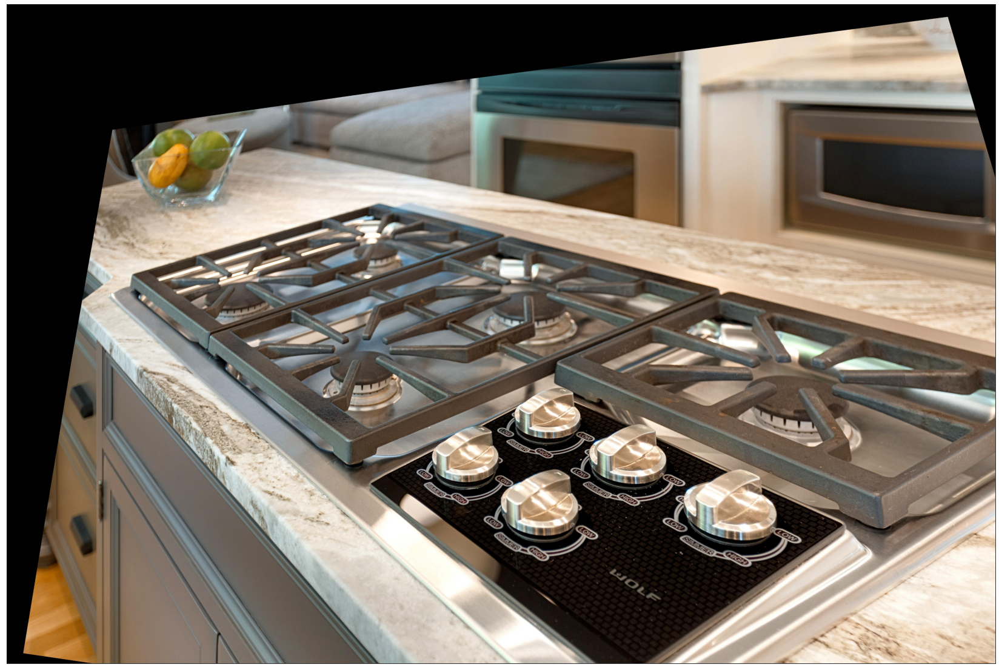

In [9]:
from matplotlib import pyplot as plt
from PIL import Image

# Load image
image = Image.open("../test/media/constrain/straight.jpg")

# Plot
plt.figure(figsize=(30,20))
plt.imshow(image)
plt.xticks([])
plt.yticks([])
plt.show()

The above image is computed from the following homography:

In [10]:
from cv2 import line, transform
from numpy import array, asarray, float32

# Transform source rect
H = array([
    [ 5.62695335e-01, -1.46033827e-01,  6.20316015e+02],
    [-1.14082325e-01,  5.87215920e-01,  7.07646201e+02],
    [-5.20947217e-05, -5.62274786e-05,  1.00000000e+00]
])
src_rect = array([
    [0, 0],
    [image.width, 0],
    [image.width, image.height],
    [0, image.height]
], dtype=float32)

# Compute destination rect
dst_rect = transform(src_rect[None,:], H)
dst_rect = dst_rect[0,:,:2] / dst_rect[0,:,2:]
dst_rect

array([[ 620.31604,  707.6462 ],
       [5516.8613 ,   72.19531],
       [6819.2744 , 4763.103  ],
       [  75.94334, 3778.353  ]], dtype=float32)

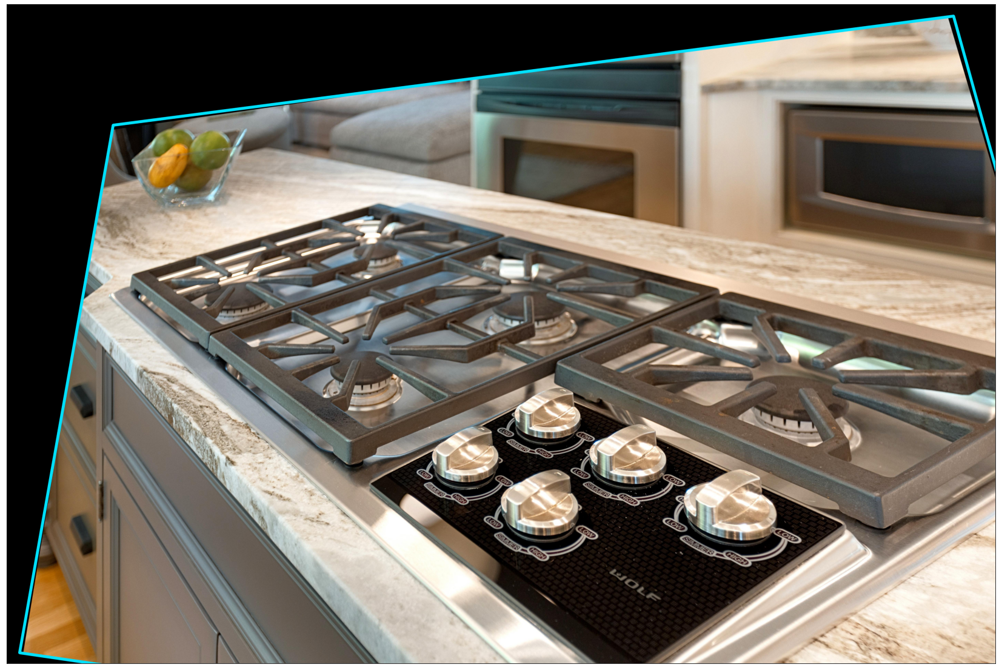

In [11]:
# Draw
line_image = asarray(image)
for i in range(4):
    x1, y1 = dst_rect[i].astype(int)
    x2, y2 = dst_rect[(i+1) % 4].astype(int)
    line(line_image, (x1, y1), (x2, y2), (0, 225, 255), 16)

# Plot
plt.figure(figsize=(30,20))
plt.imshow(line_image)
plt.xticks([])
plt.yticks([])
plt.show()

Now, we compute $\{ \hat{N}_i \}$:

In [12]:
from numpy import diff, zeros_like
from numpy.linalg import norm

# Compute edges
edges = diff(dst_rect, axis=0, append=dst_rect[:1,:])

# Compute internal normals
normals = zeros_like(edges)
normals[:,0] = -edges[:,1]
normals[:,1] = edges[:,0]
normals = normals / norm(normals, axis=1, keepdims=True)
normals

array([[ 0.12869614,  0.99168414],
       [-0.96355057,  0.26752624],
       [ 0.14450052, -0.98950475],
       [ 0.98464704,  0.1745575 ]], dtype=float32)

Next, we define $\{ P_i \}$:

In [19]:
aspect = image.width / image.height
P = array([
    [ # R0
        [1., 0., 0.],
        [0., 1., 0.]
    ],
    [ # R1
        [1., 0., 1.],
        [0., 1., 0.]
    ],
    [ # R2
        [1., 0., 1.],
        [0., 1., 1. / aspect]
    ],
    [ #R3
        [1., 0., 0.],
        [0., 1., 1. / aspect]
    ]
])
P

array([[[1.        , 0.        , 0.        ],
        [0.        , 1.        , 0.        ]],

       [[1.        , 0.        , 1.        ],
        [0.        , 1.        , 0.        ]],

       [[1.        , 0.        , 1.        ],
        [0.        , 1.        , 0.66666667]],

       [[1.        , 0.        , 0.        ],
        [0.        , 1.        , 0.66666667]]])

We reduce the matrices with the normals:

In [29]:
from itertools import product

# Compute linear constraints
A_ub = []
b_ub = []
for p, (n, v) in product(P, zip(normals, dst_rect)):
    A = n @ p
    b = (n * v).sum()
    A_ub.append(A)
    b_ub.append(b)
A_ub = array(A_ub)
b_ub = array(b_ub)

A_ub

array([[ 0.12869614,  0.99168414,  0.        ],
       [-0.96355057,  0.26752624,  0.        ],
       [ 0.14450052, -0.98950475,  0.        ],
       [ 0.98464704,  0.17455751,  0.        ],
       [ 0.12869614,  0.99168414,  0.12869614],
       [-0.96355057,  0.26752624, -0.96355057],
       [ 0.14450052, -0.98950475,  0.14450052],
       [ 0.98464704,  0.17455751,  0.98464704],
       [ 0.12869614,  0.99168414,  0.7898189 ],
       [-0.96355057,  0.26752624, -0.78519974],
       [ 0.14450052, -0.98950475, -0.51516931],
       [ 0.98464704,  0.17455751,  1.10101871],
       [ 0.12869614,  0.99168414,  0.66112276],
       [-0.96355057,  0.26752624,  0.17835083],
       [ 0.14450052, -0.98950475, -0.65966984],
       [ 0.98464704,  0.17455751,  0.11637167]])

In [30]:
b_ub

array([  781.59375, -5296.461  , -3727.7246 ,   734.31726,   781.59375,
       -5296.461  , -3727.7246 ,   734.31726,   781.59375, -5296.461  ,
       -3727.7246 ,   734.31726,   781.59375, -5296.461  , -3727.7246 ,
         734.31726], dtype=float32)

Now we optimize:

In [31]:
from cv2 import rectangle
from numpy import zeros
from scipy.optimize import linprog

# Optimize
c = array([ 0., 0., 1. ])
result = linprog(-c, -A_ub, -b_ub)
result

     con: array([], dtype=float64)
     fun: -4824.5199128661425
 message: 'Optimization terminated successfully.'
     nit: 7
   slack: array([8.34143066e-09, 4.64866890e+03, 3.18259026e+03, 2.30700796e+02,
       6.20897108e+02, 2.87382136e-08, 3.87973592e+03, 4.98115003e+03,
       3.81049702e+03, 8.60457112e+02, 6.97145655e+02, 5.54258747e+03,
       3.18959992e+03, 5.50912601e+03, 1.06938387e-08, 7.92138241e+02])
  status: 0
 success: True
       x: array([ 860.13126897,  676.52405282, 4824.51991287])

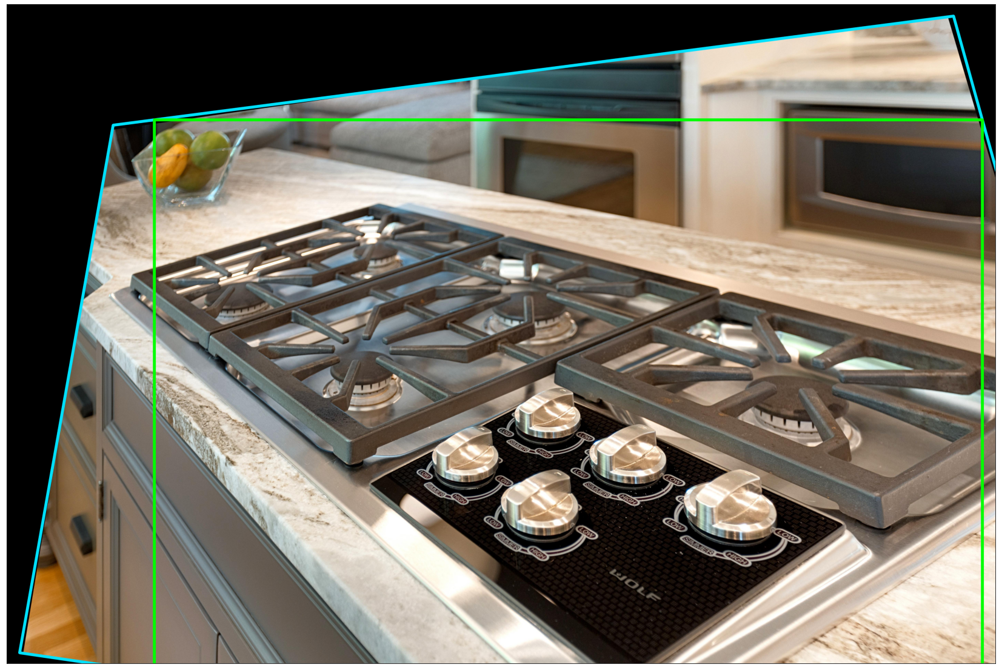

In [32]:
# Draw
u, v, w = result.x.astype(int)
result_image = line_image.copy()
rectangle(result_image, (u, v), (u + w, v + int(w / aspect)), (0,255,0), 16)

# Plot
plt.figure(figsize=(30,20))
plt.imshow(result_image)
plt.xticks([])
plt.yticks([])
plt.show()